<a href="https://colab.research.google.com/github/kebuhcah/colab-notebooks/blob/main/stable_diffusion_sandbox.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Stable Diffusion Sandbox** 🎨 
*...using `🧨diffusers`*

Copied from tutorial for 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers). 

In [1]:
!nvidia-smi

Mon Feb 27 22:51:30 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0    51W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install diffusers==0.11.1 --quiet
!pip install transformers scipy ftfy accelerate --quiet
!pip show diffusers | egrep "Name|Version"
!pip show transformers | egrep "Name|Version"
!pip show scipy | egrep "Name|Version"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 KB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 25.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 68.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 KB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.7/199.7 KB 25.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 16.3 MB/s eta 0:00:00
Name: diffusers
Version: 0.11.1
Name: transformers
Version: 4.26.1
Name: scipy
Version: 1.7.3


In [3]:
# model options:
# CompVis/stable-diffusion-v1-4
# runwayml/stable-diffusion-v1-5
# stabilityai/stable-diffusion-2-1-base
# stabilityai/stable-diffusion-2-1 (needs premium GPU/high RAM)

import torch
from diffusers import StableDiffusionPipeline
import os
import sys

pipe = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1", torch_dtype=torch.float16)  

pipe = pipe.to("cuda")

from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

In [29]:
def generateImagesWithSeed(prompt, rows, cols, seed=None, **kwargs):
  img_count = rows * cols

  generator = torch.Generator("cuda")
  if seed is None:
    generator.seed()
    seed = generator.initial_seed()
  else:
      generator.manual_seed(seed)

  images = pipe([prompt] * img_count, generator=generator, **kwargs).images

  print(seed)

  return image_grid(images, rows, cols)

  0%|          | 0/50 [00:00<?, ?it/s]

6957871647060885


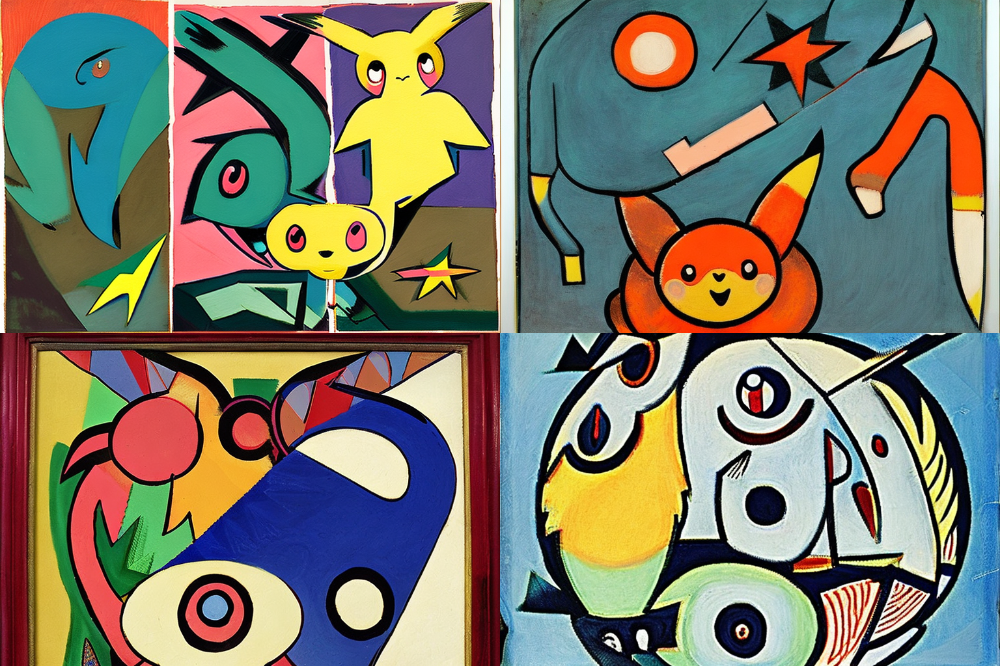

In [30]:
generateImagesWithSeed("pokemon by pablo picasso", 2, 2, height=512, width=768)

  0%|          | 0/50 [00:00<?, ?it/s]

6957871647060885


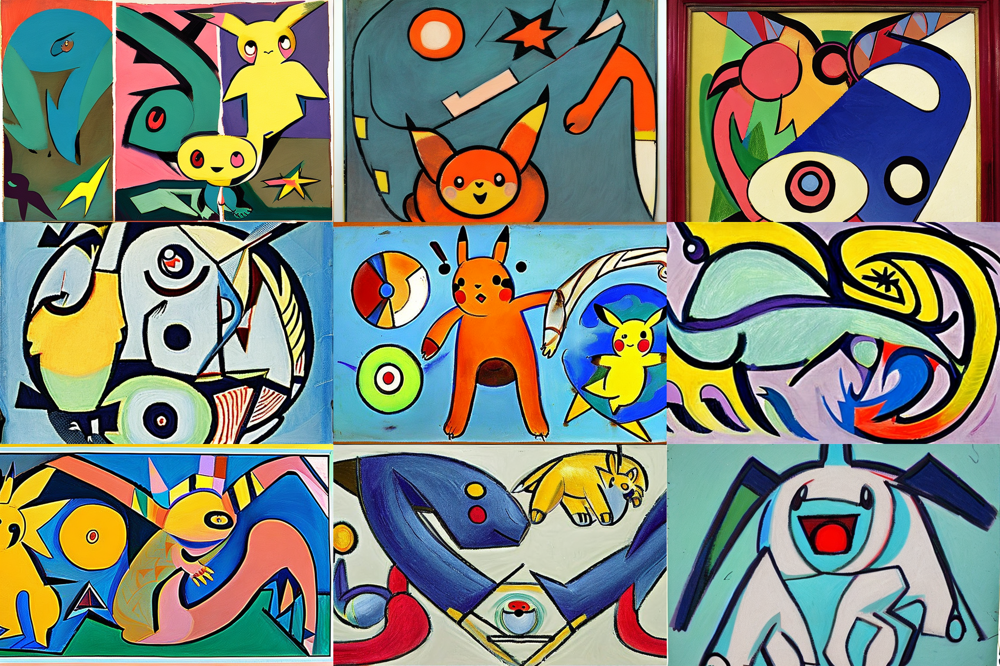

In [32]:
generateImagesWithSeed("pokemon by pablo picasso", 3, 3, 6957871647060885, height=512, width=768)